# Image Filtering Tutorial - Part I

Welcome to this interactive tutorial on image filtering techniques using Python! Throughout this notebook, we'll explore the fundamental concepts of image processing, with a focus on filtering operations. This tutorial combines theoretical explanations with hands-on coding exercises.

## Table of Contents
1. [Setting Up the Environment](#setup)
2. [Understanding Digital Images](#digital-images)
3. [Image Smoothing and Blurring](#smoothing)
4. [Gaussian Filtering for Denoising](#gaussian)
5. [Image Gradients](#gradients)
6. [Image Histograms](#histograms)
7. [Histogram Equalization](#equalization)
8. [Adaptive Histogram Equalization](#adaptive)
9. [Final Project](#project)

<a id="setup"></a>
## 1. Setting Up the Environment

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

%matplotlib inline

plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 14

def display_image(image, title="Image", cmap=None):
    """Display an image with proper formatting"""
    plt.figure(figsize=(10, 8))
    if len(image.shape) == 3 and image.shape[2] == 3:  # Color image
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    else:  # Grayscale image
        plt.imshow(image, cmap=cmap)
    plt.title(title)
    plt.axis('on')
    plt.colorbar(shrink=0.8)
    plt.show()



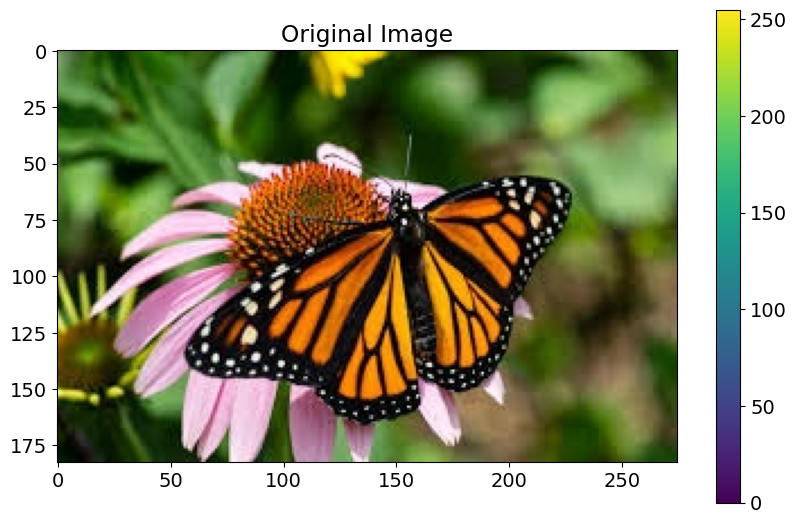

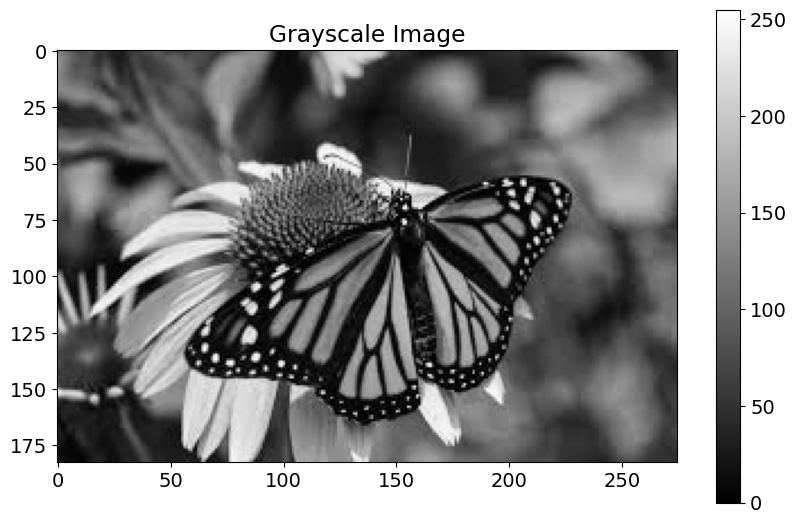

In [2]:
image_path = "butterfly.jpg"
original_image = cv2.imread(image_path)
    
gray_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)

# Display both versions
display_image(original_image, "Original Image")
display_image(gray_image, "Grayscale Image", cmap='gray')


<a id="digital-images"></a>
## 2. Understanding Digital Images

Before diving into filtering techniques, let's understand how digital images are represented and manipulated.

### 2.1 Mathematical Representation of Images

Digital images are represented as discrete functions $f(x,y)$ where:
- $(x,y)$ are spatial coordinates
- $f$ is the intensity or pixel value at that point

For a grayscale image, $f(x,y)$ is a single value representing brightness.
For a color image, $f(x,y)$ is typically a vector of values (like RGB).

In Python, images are represented as multi-dimensional arrays:
- A grayscale image is a 2D array of shape (height, width)
- A color image is a 3D array of shape (height, width, channels)

Let's examine the structure of our image:


In [3]:
print(f"Original image shape: {original_image.shape}")
print(f"Original image data type: {original_image.dtype}")
print(f"Grayscale image shape: {gray_image.shape}")

print("\nPixel values in a 5x5 region of the grayscale image:")
small_region = gray_image[100:105, 100:105]
print(small_region)


Original image shape: (183, 275, 3)
Original image data type: uint8
Grayscale image shape: (183, 275)

Pixel values in a 5x5 region of the grayscale image:
[[  2   1   1   3  19]
 [ 40   4  14   9   2]
 [110   5   2   3  13]
 [ 81   2  17   6   8]
 [  8   3   4   9  15]]


### 2.2 Image as a Signal

An image can be viewed as a 2D signal. When we process images, we're essentially manipulating this signal to enhance certain features or suppress others.



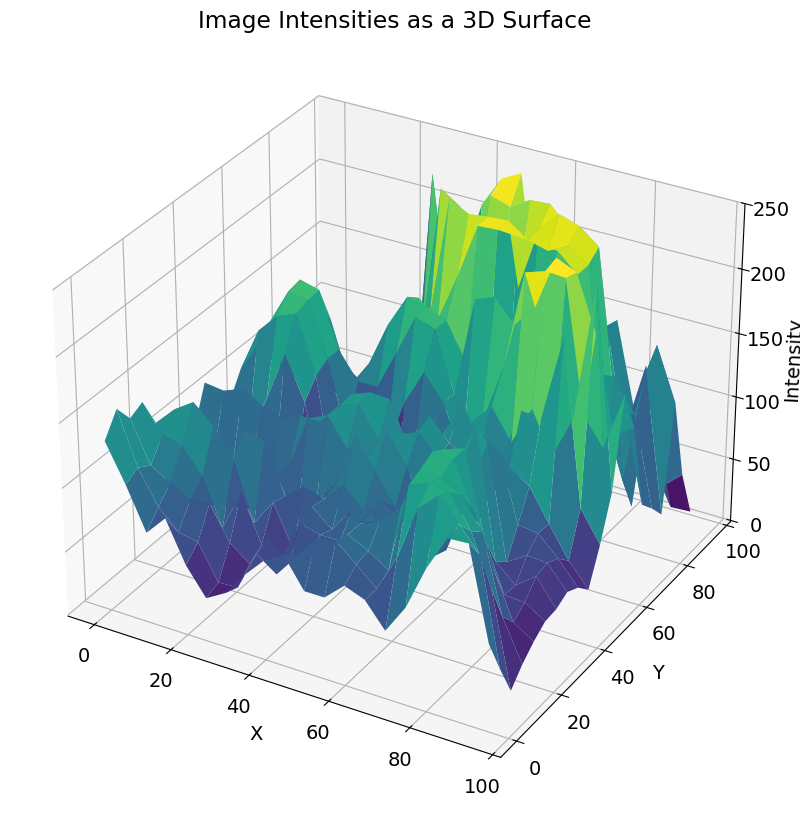

In [4]:
# Let's visualize an image as a 3D surface where height represents pixel intensity
y, x = np.mgrid[0:100:5, 0:100:5]  # Sample points
z = gray_image[0:100:5, 0:100:5]   # Intensity values

plt.figure(figsize=(12, 10))
ax = plt.axes(projection='3d')
ax.plot_surface(x, y, z, cmap='viridis')
ax.set_title('Image Intensities as a 3D Surface')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Intensity')
plt.show()


> **Interactive Exercise**: Look at the 3D surface plot above. Can you identify areas of high contrast? What would happen to this surface if we blurred the image?


<a id="smoothing"></a>
## 3. Image Smoothing and Blurring


Image smoothing (or blurring) is a fundamental operation in image processing that reduces noise and detail in an image.

### 3.1 Mathematical Foundation: Convolution

At the heart of image filtering is the convolution operation. For a discrete 2D image $f$ and a kernel $h$, the convolution is defined as:

$$(f * h)(x, y) = \sum_{s=-a}^{a} \sum_{t=-b}^{b} f(x-s, y-t) \cdot h(s, t)$$

Where:
- $f$ is the input image
- $h$ is the convolution kernel (filter)
- $(x,y)$ are the coordinates in the output image
- $a$ and $b$ define the size of the kernel

In simpler terms, for each pixel, we:
1. Center the kernel at that pixel
2. Multiply each kernel value with the corresponding image pixel
3. Sum all these products to get the new pixel value



### 3.2 Box Blur (Average Filter)

The simplest form of smoothing is the box blur, which replaces each pixel with the average of its neighboring pixels:


In [5]:
cv2.blur?

Docstring:
blur(src, ksize[, dst[, anchor[, borderType]]]) -> dst
.   @brief Blurs an image using the normalized box filter.
.   
.   The function smooths an image using the kernel:
.   
.   \f[\texttt{K} =  \frac{1}{\texttt{ksize.width*ksize.height}} \begin{bmatrix} 1 & 1 & 1 &  \cdots & 1 & 1  \\ 1 & 1 & 1 &  \cdots & 1 & 1  \\ \hdotsfor{6} \\ 1 & 1 & 1 &  \cdots & 1 & 1  \\ \end{bmatrix}\f]
.   
.   The call `blur(src, dst, ksize, anchor, borderType)` is equivalent to `boxFilter(src, dst, src.type(), ksize,
.   anchor, true, borderType)`.
.   
.   @param src input image; it can have any number of channels, which are processed independently, but
.   the depth should be CV_8U, CV_16U, CV_16S, CV_32F or CV_64F.
.   @param dst output image of the same size and type as src.
.   @param ksize blurring kernel size.
.   @param anchor anchor point; default value Point(-1,-1) means that the anchor is at the kernel
.   center.
.   @param borderType border mode used to extrapolate pixels outside

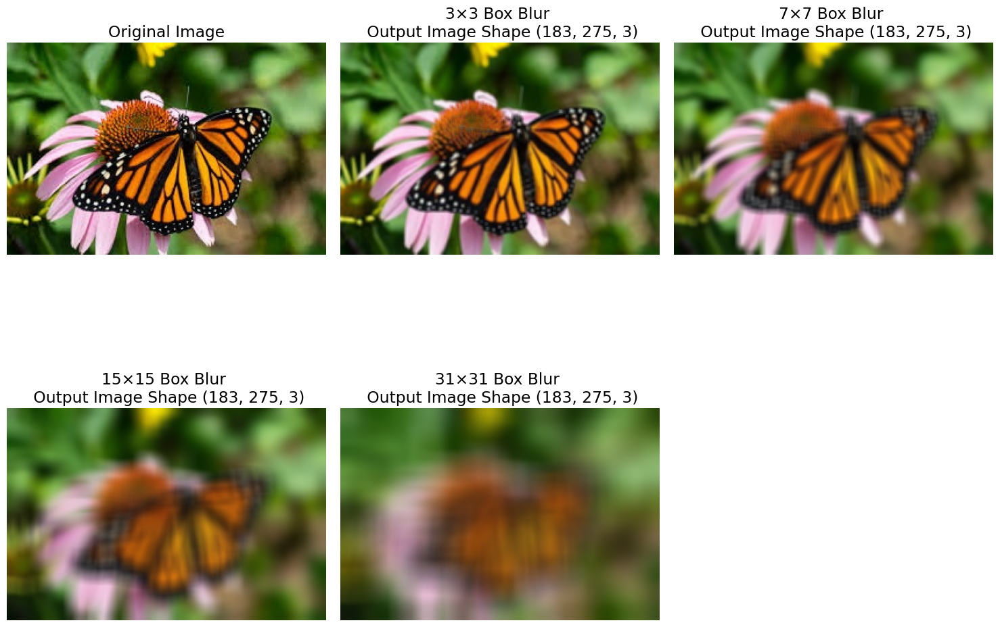

5×5 Box Kernel:
[[0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]
 [0.04 0.04 0.04 0.04 0.04]]


In [6]:
# Note: Odd values are important
kernel_sizes = [3, 7, 15, 31]

plt.figure(figsize=(15, 12))

# Add the original image as reference
plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis('off')

for i, k in enumerate(kernel_sizes):
    # Uses a box filter
    blurred = cv2.blur(original_image, (k, k))
    
    
    # Display the result
    plt.subplot(2, 3, i+2)
    plt.imshow(cv2.cvtColor(blurred, cv2.COLOR_BGR2RGB))
    # The cv2.blur function is adding the border values back in, therefore size of the image does not change.
    plt.title(f"{k}×{k} Box Blur \n Output Image Shape {blurred.shape}")
    plt.axis('off')

plt.tight_layout()
plt.show()

box_kernel = np.ones((5, 5)) / 25  
print("5×5 Box Kernel:")
print(box_kernel)


> **Common Pitfall**: Box filters can create visible "blocking" artifacts, especially with larger kernel sizes. They also give equal weight to all pixels in the neighborhood, which might not be desirable for preserving edges.


### 3.3 Median Blur

Unlike the average filter, the median filter replaces each pixel with the median value of its neighborhood. This is particularly effective at removing "salt and pepper" noise while preserving edges.

In [8]:
cv2.medianBlur?

Docstring:
medianBlur(src, ksize[, dst]) -> dst
.   @brief Blurs an image using the median filter.
.   
.   The function smoothes an image using the median filter with the \f$\texttt{ksize} \times
.   \texttt{ksize}\f$ aperture. Each channel of a multi-channel image is processed independently.
.   In-place operation is supported.
.   
.   @note The median filter uses #BORDER_REPLICATE internally to cope with border pixels, see #BorderTypes
.   
.   @param src input 1-, 3-, or 4-channel image; when ksize is 3 or 5, the image depth should be
.   CV_8U, CV_16U, or CV_32F, for larger aperture sizes, it can only be CV_8U.
.   @param dst destination array of the same size and type as src.
.   @param ksize aperture linear size; it must be odd and greater than 1, for example: 3, 5, 7 ...
.   @sa  bilateralFilter, blur, boxFilter, GaussianBlur
Type:      builtin_function_or_method

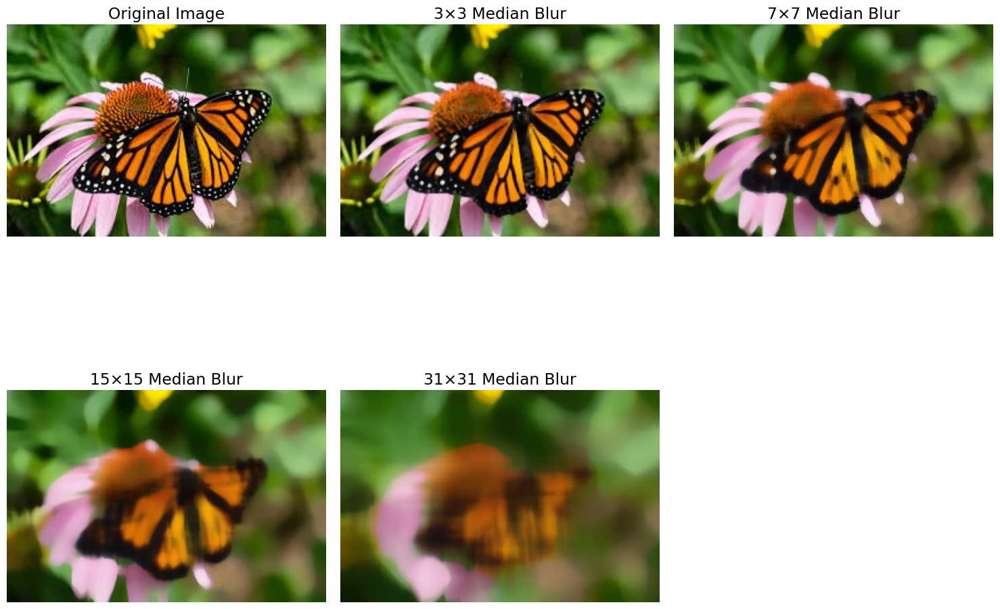

In [7]:
# Similar to an Activation Function
plt.figure(figsize=(15, 12))

# Add the original image as reference
plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis('off')

# Apply median blur with different kernel sizes
for i, k in enumerate(kernel_sizes):
    # Make sure kernel size is odd
    if k % 2 == 0:
        k += 1
    
    median_blurred = cv2.medianBlur(original_image, k)
    
    # Display the result
    plt.subplot(2, 3, i+2)
    plt.imshow(cv2.cvtColor(median_blurred, cv2.COLOR_BGR2RGB))
    plt.title(f"{k}×{k} Median Blur")
    plt.axis('off')

plt.tight_layout()
plt.show()


> **Interactive Exercise**: 
> 1. How does the median filter perform compared to the box filter, especially around edges?
> 2. When would you choose a median filter over a box filter, and why?
> 

> What kind of filter would mediaun blur be in the frequency domain?
> 
> 1. Low Pass Filter (Removes high frequency)
> 2. High Pass Filter (Removes low frequency)

<a id="gaussian"></a>
## 4. Gaussian Filtering for Denoising

Gaussian filtering is a more sophisticated technique that uses a weighted average, where central pixels have more influence than distant ones.

### 4.1 Mathematical Foundation: Gaussian Functions

The 2D Gaussian function is defined as:

$$G(x, y) = \frac{1}{2\pi\sigma^2} e^{-\frac{x^2 + y^2}{2\sigma^2}}$$

Where:
- $(x,y)$ are the coordinates from the center
- $\sigma$ is the standard deviation (controls the spread)

When discretized to form a kernel, this gives us a bell-shaped weight distribution.


### 4.2 Applying Gaussian Blur


The Gaussian filter has several important mathematical properties that make it ideal for image processing:

1. **Isotropy**: The filter is radially symmetric, meaning it treats all directions equally
2. **Separability**: A 2D Gaussian filter can be separated into two 1D filters (horizontal and vertical), which greatly improves computational efficiency
3. **Frequency Domain**: In the frequency domain, the Gaussian filter is also a Gaussian, which means it suppresses high frequencies (details/noise) while preserving low frequencies (overall structure)

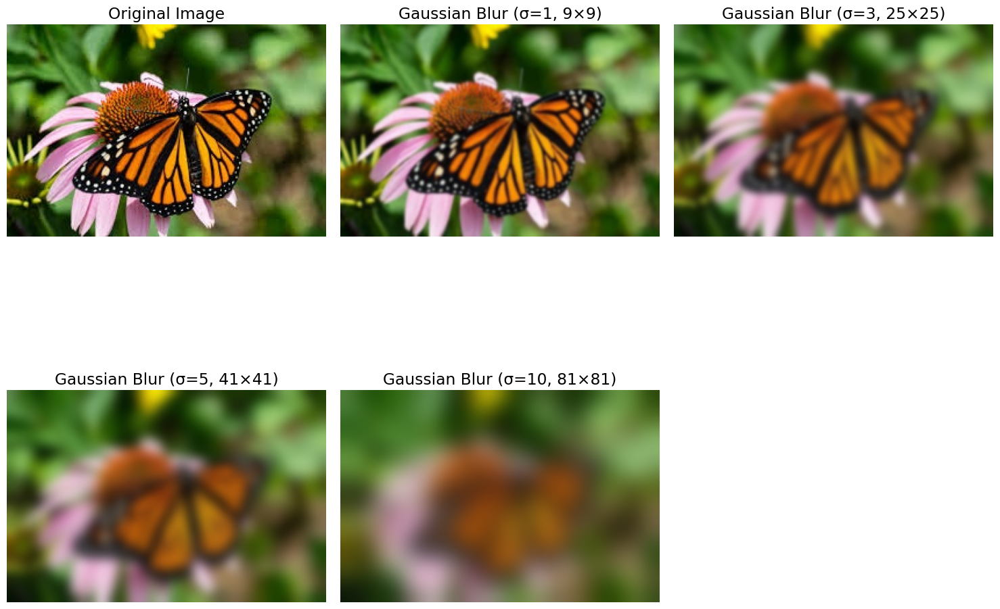

In [7]:
sigma_values = [1, 3, 5, 10]

plt.figure(figsize=(15, 12))


plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis('off')


for i, sigma in enumerate(sigma_values):
    # The kernel size - must be odd and positive
    ksize = 2 * int(4 * sigma + 0.5) + 1
    gaussian_blurred = cv2.GaussianBlur(original_image, (ksize, ksize), sigma)
    
    # Display the result
    plt.subplot(2, 3, i+2)
    plt.imshow(cv2.cvtColor(gaussian_blurred, cv2.COLOR_BGR2RGB))
    plt.title(f"Gaussian Blur (σ={sigma}, {ksize}×{ksize})")
    plt.axis('off')

plt.tight_layout()
plt.show()


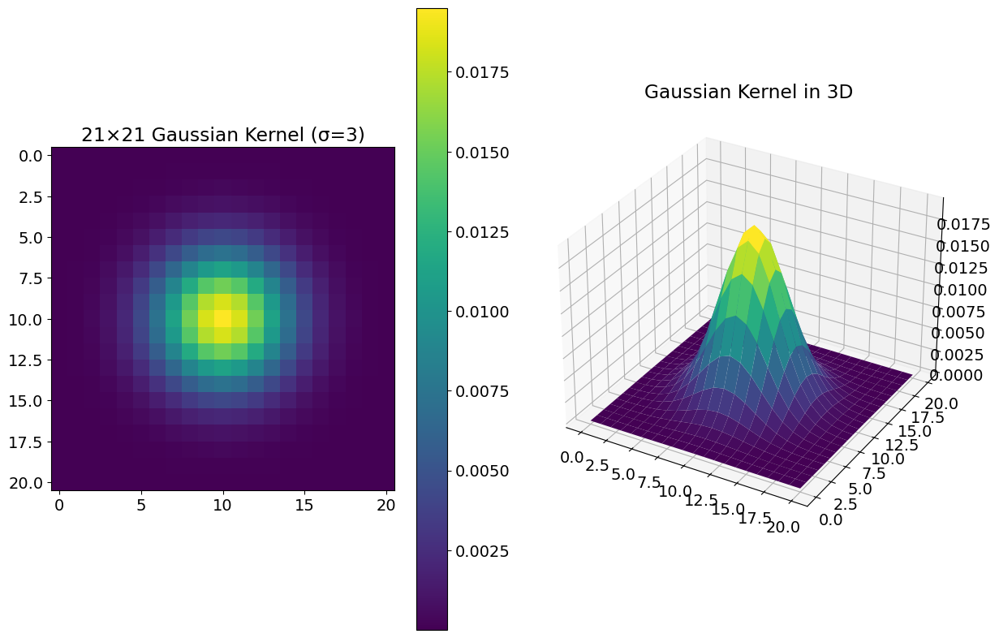

In [8]:
# Let's visualize a Gaussian kernel
def gaussian_kernel(size, sigma):
    """Generate a 2D Gaussian kernel"""
    x, y = np.meshgrid(np.linspace(-size/2, size/2, size), np.linspace(-size/2, size/2, size))
    g = np.exp(-(x**2 + y**2) / (2 * sigma**2))
    return g / g.sum()  # Normalize so the sum is 1

# Create and display a Gaussian kernel
kernel_size = 21
gauss_kernel = gaussian_kernel(kernel_size, 3)

plt.figure(figsize=(12, 10))

# 2D visualization
plt.subplot(1, 2, 1)
plt.imshow(gauss_kernel, cmap='viridis')
plt.title(f"{kernel_size}×{kernel_size} Gaussian Kernel (σ=3)")
plt.colorbar(shrink=0.8)

# 3D visualization
ax = plt.subplot(1, 2, 2, projection='3d')
y, x = np.mgrid[0:kernel_size, 0:kernel_size]
ax.plot_surface(x, y, gauss_kernel, cmap='viridis')
ax.set_title('Gaussian Kernel in 3D')

plt.tight_layout()
plt.show()


### 4.3 Gaussian Denoising in Practice

Let's see how Gaussian filtering performs on images with added noise:


In [9]:
# First, let's create a noisy version of our image
def add_gaussian_noise(image, mean=0, sigma=25):
    """Add Gaussian noise to an image"""
    noise = np.random.normal(mean, sigma, image.shape).astype(np.int16)
    noisy_image = cv2.add(image.astype(np.int16), noise)
    return np.clip(noisy_image, 0, 255).astype(np.uint8)

def add_salt_pepper_noise(image, salt_prob=0.01, pepper_prob=0.01):
    """Add salt and pepper noise to an image"""
    noisy_image = np.copy(image)
    
    # Salt noise (white)
    salt_mask = np.random.random(image.shape[:2]) < salt_prob
    if len(image.shape) == 3:  # Color image
        for i in range(3):
            noisy_image[salt_mask, i] = 255
    else:  # Grayscale
        noisy_image[salt_mask] = 255
    
    # Pepper noise (black)
    pepper_mask = np.random.random(image.shape[:2]) < pepper_prob
    if len(image.shape) == 3:  # Color image
        for i in range(3):
            noisy_image[pepper_mask, i] = 0
    else:  # Grayscale
        noisy_image[pepper_mask] = 0
    
    return noisy_image


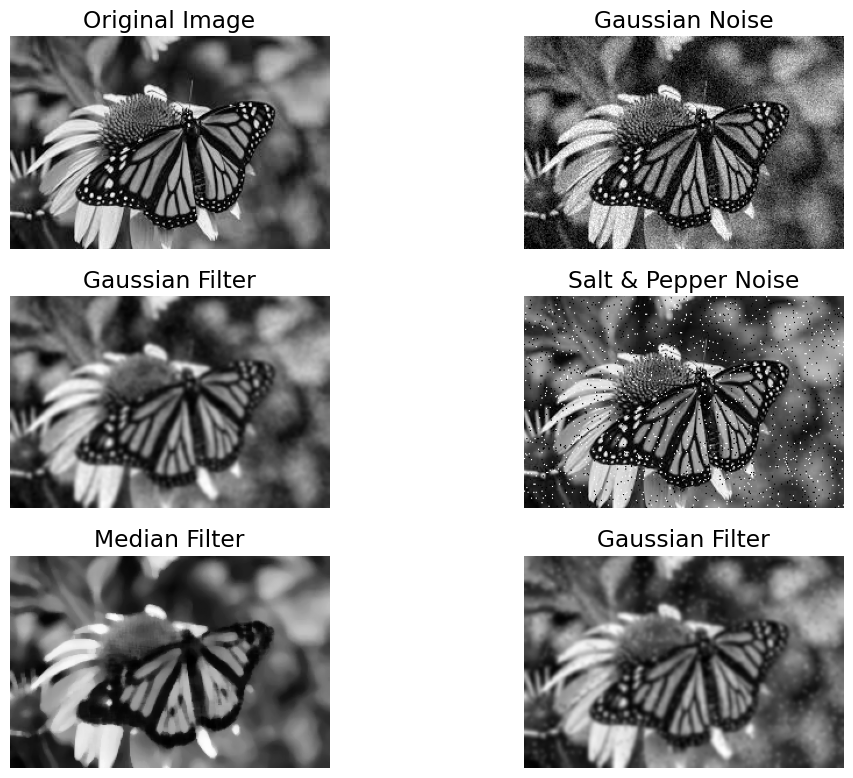

In [10]:
gaussian_noisy = add_gaussian_noise(gray_image, sigma=20)
salt_pepper_noisy = add_salt_pepper_noise(gray_image, 0.02, 0.02)  # Function from previous section

# Apply different denoising methods
# Gaussian filter
gaussian_denoised = cv2.GaussianBlur(gaussian_noisy, (7, 7), 1.5)
gaussian_sp_denoised = cv2.GaussianBlur(salt_pepper_noisy, (7, 7), 1.5)

# Median filter
median_denoised = cv2.medianBlur(gaussian_noisy, 7)
median_sp_denoised = cv2.medianBlur(salt_pepper_noisy, 7)


plt.subplot(3, 2, 1)
plt.imshow(gray_image, cmap='gray')
plt.title("Original Image")
plt.axis('off')

plt.subplot(3, 2, 2)
plt.imshow(gaussian_noisy, cmap='gray')
plt.title("Gaussian Noise")
plt.axis('off')

plt.subplot(3, 2, 3)
plt.imshow(gaussian_denoised, cmap='gray')
plt.title("Gaussian Filter")
plt.axis('off')

# Second row: Salt & Pepper noise
plt.subplot(3, 2, 4)
plt.imshow(salt_pepper_noisy, cmap='gray')
plt.title("Salt & Pepper Noise")
plt.axis('off')

plt.subplot(3, 2, 5)
plt.imshow(median_sp_denoised, cmap='gray')
plt.title("Median Filter")
plt.axis('off')

plt.subplot(3, 2, 6)
plt.imshow(gaussian_sp_denoised, cmap='gray')
plt.title("Gaussian Filter")
plt.axis('off')

plt.tight_layout()
plt.show()

> **Common Pitfall**: While Gaussian filtering is excellent for removing Gaussian noise, it tends to blur edges. The **bilateral filter** addresses this limitation by considering both spatial distance and pixel value differences.

> **Interactive Exercise**: Looking at the denoising results above:
> 1. Which filter works best for Gaussian noise? Why?
> 2. Which filter works best for Salt & Pepper noise? Why?
> 3. What happens to edge details with each filter type?


<a id="gradients"></a>
## 5. Image Gradients

Image gradients are a fundamental concept in image processing, acting as building blocks for edge detection, feature extraction, and more advanced computer vision algorithms.

### 5.1 Mathematical Foundation: Derivatives in Images

In calculus, the gradient of a function is a vector that points in the direction of the greatest rate of increase of the function, with magnitude equal to the rate of change.

For an image function $f(x,y)$, the gradient is defined as:

$$\nabla f = \begin{bmatrix} \frac{\partial f}{\partial x} \\ \frac{\partial f}{\partial y} \end{bmatrix}$$

Where:
- $\frac{\partial f}{\partial x}$ is the partial derivative in the x-direction
- $\frac{\partial f}{\partial y}$ is the partial derivative in the y-direction

The magnitude of the gradient is:

$$|\nabla f| = \sqrt{\left(\frac{\partial f}{\partial x}\right)^2 + \left(\frac{\partial f}{\partial y}\right)^2}$$

And the direction of the gradient is:

$$\theta = \tan^{-1}\left(\frac{\frac{\partial f}{\partial y}}{\frac{\partial f}{\partial x}}\right)$$



### 5.2 Gradient Operators: Sobel, Scharr, and Prewitt
### (Approximates Derivatives)

In discrete images, we approximate derivatives using convolution with specific kernels. The most common gradient operators are:

1. **Sobel Operator**:
   - x-direction: $\begin{bmatrix} -1 & 0 & 1 \\ -2 & 0 & 2 \\ -1 & 0 & 1 \end{bmatrix}$
   - y-direction: $\begin{bmatrix} -1 & -2 & -1 \\ 0 & 0 & 0 \\ 1 & 2 & 1 \end{bmatrix}$

2. **Scharr Operator** (better angular accuracy):
   - x-direction: $\begin{bmatrix} -3 & 0 & 3 \\ -10 & 0 & 10 \\ -3 & 0 & 3 \end{bmatrix}$
   - y-direction: $\begin{bmatrix} -3 & -10 & -3 \\ 0 & 0 & 0 \\ 3 & 10 & 3 \end{bmatrix}$

3. **Prewitt Operator**:
   - x-direction: $\begin{bmatrix} -1 & 0 & 1 \\ -1 & 0 & 1 \\ -1 & 0 & 1 \end{bmatrix}$
   - y-direction: $\begin{bmatrix} -1 & -1 & -1 \\ 0 & 0 & 0 \\ 1 & 1 & 1 \end{bmatrix}$

Let's implement and compare these operators:



In [11]:
cv2.Sobel?

Docstring:
Sobel(src, ddepth, dx, dy[, dst[, ksize[, scale[, delta[, borderType]]]]]) -> dst
.   @brief Calculates the first, second, third, or mixed image derivatives using an extended Sobel operator.
.   
.   In all cases except one, the \f$\texttt{ksize} \times \texttt{ksize}\f$ separable kernel is used to
.   calculate the derivative. When \f$\texttt{ksize = 1}\f$, the \f$3 \times 1\f$ or \f$1 \times 3\f$
.   kernel is used (that is, no Gaussian smoothing is done). `ksize = 1` can only be used for the first
.   or the second x- or y- derivatives.
.   
.   There is also the special value `ksize = #FILTER_SCHARR (-1)` that corresponds to the \f$3\times3\f$ Scharr
.   filter that may give more accurate results than the \f$3\times3\f$ Sobel. The Scharr aperture is
.   
.   \f[\vecthreethree{-3}{0}{3}{-10}{0}{10}{-3}{0}{3}\f]
.   
.   for the x-derivative, or transposed for the y-derivative.
.   
.   The function calculates an image derivative by convolving the image with the appropriat

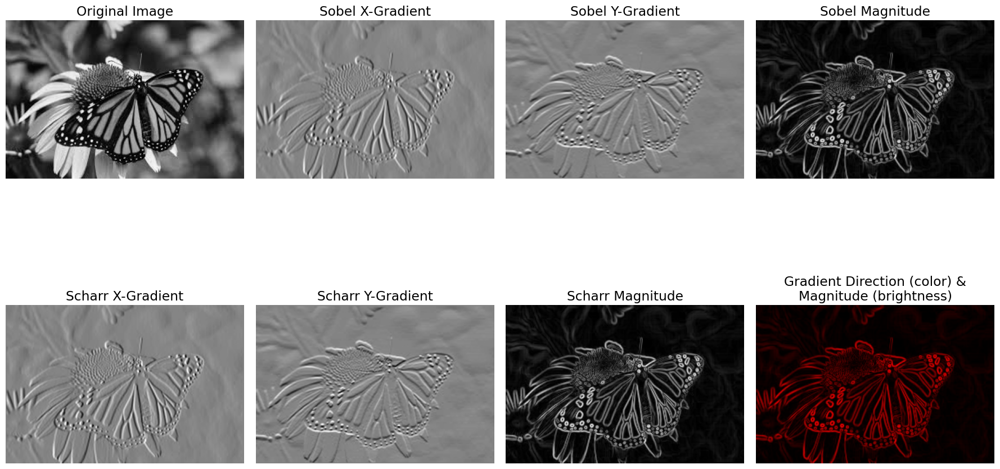

In [12]:
# Compute gradients using different operators
# Sobel
sobelx = cv2.Sobel(gray_image, cv2.CV_64F, 1, 0, ksize=3)
sobely = cv2.Sobel(gray_image, cv2.CV_64F, 0, 1, ksize=3)
sobel_magnitude = np.sqrt(sobelx**2 + sobely**2)
sobel_direction = np.arctan2(sobely, sobelx) * (180/np.pi)

# Scharr
scharrx = cv2.Scharr(gray_image, cv2.CV_64F, 1, 0)
scharry = cv2.Scharr(gray_image, cv2.CV_64F, 0, 1)
scharr_magnitude = np.sqrt(scharrx**2 + scharry**2)

# Normalize for display
def normalize_for_display(img):
    return cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

# Display the results
plt.figure(figsize=(18, 12))

# Original image
plt.subplot(2, 4, 1)
plt.imshow(gray_image, cmap='gray')
plt.title("Original Image")
plt.axis('off')

# Sobel gradients
plt.subplot(2, 4, 2)
plt.imshow(normalize_for_display(sobelx), cmap='gray')
plt.title("Sobel X-Gradient")
plt.axis('off')

plt.subplot(2, 4, 3)
plt.imshow(normalize_for_display(sobely), cmap='gray')
plt.title("Sobel Y-Gradient")
plt.axis('off')

plt.subplot(2, 4, 4)
plt.imshow(normalize_for_display(sobel_magnitude), cmap='gray')
plt.title("Sobel Magnitude")
plt.axis('off')

# Scharr gradients and direction visualization
plt.subplot(2, 4, 5)
plt.imshow(normalize_for_display(scharrx), cmap='gray')
plt.title("Scharr X-Gradient")
plt.axis('off')

plt.subplot(2, 4, 6)
plt.imshow(normalize_for_display(scharry), cmap='gray')
plt.title("Scharr Y-Gradient")
plt.axis('off')

plt.subplot(2, 4, 7)
plt.imshow(normalize_for_display(scharr_magnitude), cmap='gray')
plt.title("Scharr Magnitude")
plt.axis('off')

# Direction visualization using HSV color space
plt.subplot(2, 4, 8)
hsv = np.zeros((gray_image.shape[0], gray_image.shape[1], 3), dtype=np.uint8)
hsv[..., 0] = sobel_direction * 0.7 / 360.0  # Hue is direction (normalized to 0-1)
hsv[..., 1] = 255  # Full saturation
hsv[..., 2] = cv2.normalize(sobel_magnitude, None, 0, 255, cv2.NORM_MINMAX)  # Value is magnitude
direction_rgb = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)
plt.imshow(direction_rgb)
plt.title("Gradient Direction (color) &\nMagnitude (brightness)")
plt.axis('off')

plt.tight_layout()
plt.show()


> Note: We see that the magnitude takes the absolute values of strong negatives pixels. Resulting in a highlighted effect.

### 5.3 Applications of Image Gradients

#### 5.3.1 Edge Detection Using Gradients

One of the most common applications of gradients is edge detection:

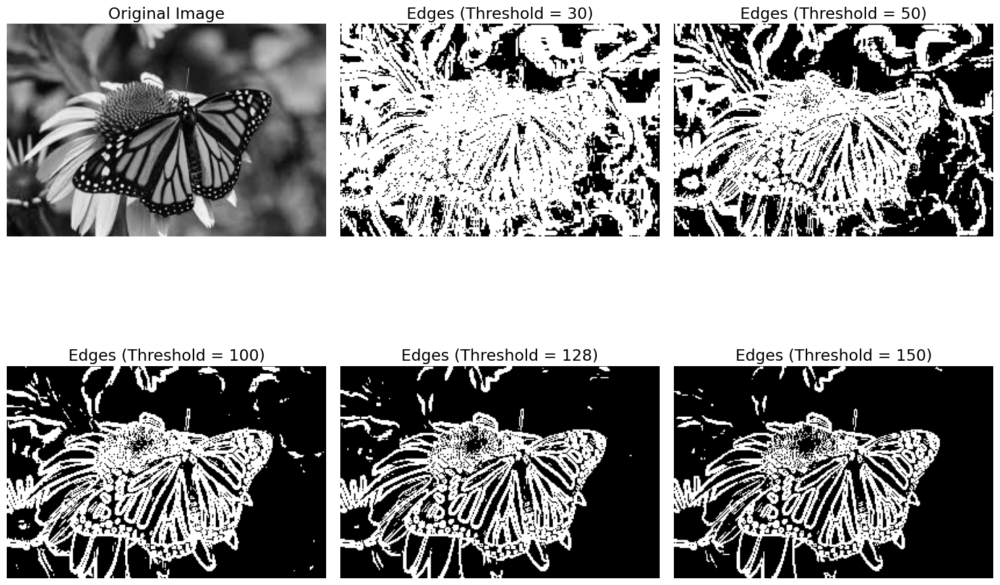

In [14]:
# Simple thresholding on gradient magnitude for edge detection
def detect_edges(image, threshold=50):
    # Compute gradients
    sobelx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)
    magnitude = np.sqrt(sobelx**2 + sobely**2)
    
    # Threshold
    # `magnitude > threshold` results in a binary value
    edges = (magnitude > threshold).astype(np.uint8) * 255
    return edges

# Apply edge detection with different thresholds
thresholds = [30, 50, 100, 128, 150]

plt.figure(figsize=(15, 12))

# Original image
plt.subplot(2, 3, 1)
plt.imshow(gray_image, cmap='gray')
plt.title("Original Image")
plt.axis('off')

# Edge detection with different thresholds
for i, threshold in enumerate(thresholds):
    edges = detect_edges(gray_image, threshold)
    
    plt.subplot(2, 3, i+2)
    plt.imshow(edges, cmap='gray')
    plt.title(f"Edges (Threshold = {threshold})")
    plt.axis('off')

plt.tight_layout()
plt.show()

#### 5.3.2 Pre-processing with Gaussian Derivatives

A common technique is to combine Gaussian smoothing with gradient calculation to create "Gaussian derivatives":

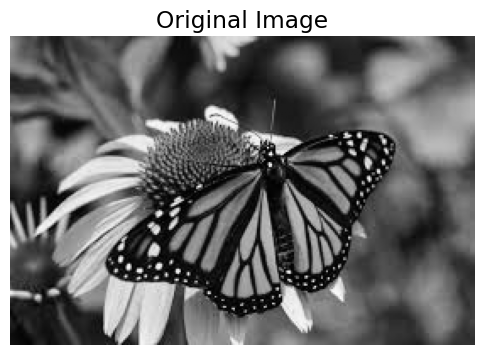

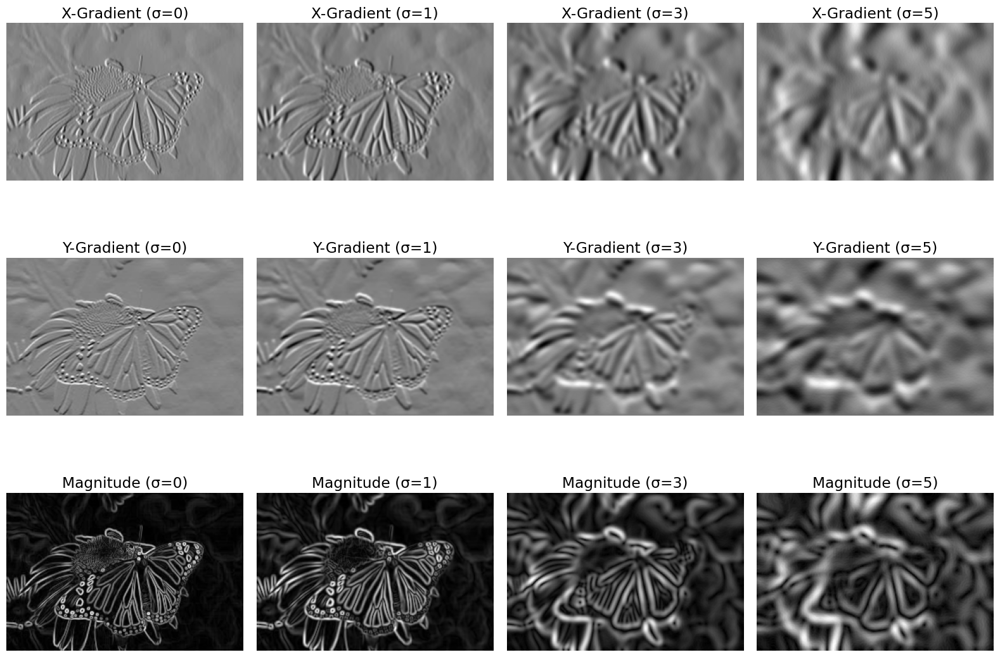

In [15]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def normalize_for_display(image):
    """Normalize the image to the 0–255 range and convert to uint8."""
    image = image - np.min(image)
    image = image / np.max(image) * 255
    return image.astype(np.uint8)

def gaussian_derivative(image, sigma=1.0):
    """
    Compute image gradients using Gaussian smoothing followed by Sobel operators.
    If sigma is 0, no Gaussian smoothing is applied.
    """
    if sigma > 0:
        smoothed = cv2.GaussianBlur(image, (0, 0), sigma)
    else:
        smoothed = image.copy()
    
    gx = cv2.Sobel(smoothed, cv2.CV_64F, 1, 0, ksize=3)
    gy = cv2.Sobel(smoothed, cv2.CV_64F, 0, 1, ksize=3)
    magnitude = np.sqrt(gx**2 + gy**2)
    
    return gx, gy, magnitude

# Assume gray_image is already defined as a grayscale image, for example:
# gray_image = cv2.imread('path_to_image', cv2.IMREAD_GRAYSCALE)

sigma_values = [0, 1, 3, 5]

# Display the original image
plt.figure(figsize=(6, 6))
plt.imshow(gray_image, cmap='gray')
plt.title("Original Image")
plt.axis('off')
plt.show()

# Create a figure for comparing gradients with different sigma values.
# We use a grid with 3 rows (for x-gradient, y-gradient, and magnitude)
# and 4 columns (one per sigma value).
plt.figure(figsize=(16, 12))

for i, sigma in enumerate(sigma_values):
    gx, gy, magnitude = gaussian_derivative(gray_image, sigma)
    
    # X-gradient (first row, column i+1)
    plt.subplot(3, 4, i+1)
    plt.imshow(normalize_for_display(gx), cmap='gray')
    plt.title(f"X-Gradient (σ={sigma})")
    plt.axis('off')
    
    # Y-gradient (second row, column i+1)
    plt.subplot(3, 4, i+1+4)
    plt.imshow(normalize_for_display(gy), cmap='gray')
    plt.title(f"Y-Gradient (σ={sigma})")
    plt.axis('off')
    
    # Magnitude (third row, column i+1)
    plt.subplot(3, 4, i+1+8)
    plt.imshow(normalize_for_display(magnitude), cmap='gray')
    plt.title(f"Magnitude (σ={sigma})")
    plt.axis('off')

plt.tight_layout()
plt.show()


> **Mathematical Insight**: The Gaussian filtering step before computing derivatives serves two important purposes:
>
> 1. **Noise reduction**: Derivatives amplify noise, and Gaussian smoothing reduces its impact
> 2. **Scale-space representation**: The sigma parameter controls the scale at which edges are detected

> **Common Pitfall**: Choosing the right sigma value is crucial. Too small, and noise will dominate; too large, and important edges may be smoothed away. The optimal value depends on the scale of features you're interested in and the amount of noise present.
> 
> **Note**: I would use median filter instead of gaussian 


### 5.4 The Laplacian Operator: Second Derivatives

While first derivatives (gradients) help detect edges, second derivatives can help identify specific features like lines, corners, and blobs.

The Laplacian operator is defined as the sum of second derivatives:

$$\nabla^2 f = \frac{\partial^2 f}{\partial x^2} + \frac{\partial^2 f}{\partial y^2}$$

In discrete form, it's often approximated using the kernel:

$$\begin{bmatrix} 0 & 1 & 0 \\ 1 & -4 & 1 \\ 0 & 1 & 0 \end{bmatrix}$$

Let's implement and explore the Laplacian:

1. **Thin, High-Contrast Edges** – The Laplacian detects edges where intensity changes rapidly, making it useful for highlighting thin and sharp edges that might be blurred by other detectors like Sobel or Canny.

2. **Edge Localization** – Since it is a second derivative operator, it provides better localization of edges compared to first derivative-based methods.

3. **Texture and Fine Detail Extraction** – If the goal is to enhance small textures and fine details rather than smooth gradients, Laplacian can be useful without excessive smoothing.

4. **Speed and Simplicity** – Unlike multi-step edge detectors like Canny, the Laplacian is computationally simpler and faster, making it useful in real-time applications.



However, due to its noise sensitivity, it’s often paired with a Gaussian filter (Laplacian of Gaussian, LoG) to mitigate noise-related issues.

In [19]:
cv2.Laplacian?

Docstring:
Laplacian(src, ddepth[, dst[, ksize[, scale[, delta[, borderType]]]]]) -> dst
.   @brief Calculates the Laplacian of an image.
.   
.   The function calculates the Laplacian of the source image by adding up the second x and y
.   derivatives calculated using the Sobel operator:
.   
.   \f[\texttt{dst} =  \Delta \texttt{src} =  \frac{\partial^2 \texttt{src}}{\partial x^2} +  \frac{\partial^2 \texttt{src}}{\partial y^2}\f]
.   
.   This is done when `ksize > 1`. When `ksize == 1`, the Laplacian is computed by filtering the image
.   with the following \f$3 \times 3\f$ aperture:
.   
.   \f[\vecthreethree {0}{1}{0}{1}{-4}{1}{0}{1}{0}\f]
.   
.   @param src Source image.
.   @param dst Destination image of the same size and the same number of channels as src .
.   @param ddepth Desired depth of the destination image, see @ref filter_depths "combinations".
.   @param ksize Aperture size used to compute the second-derivative filters. See #getDerivKernels for
.   details. The size

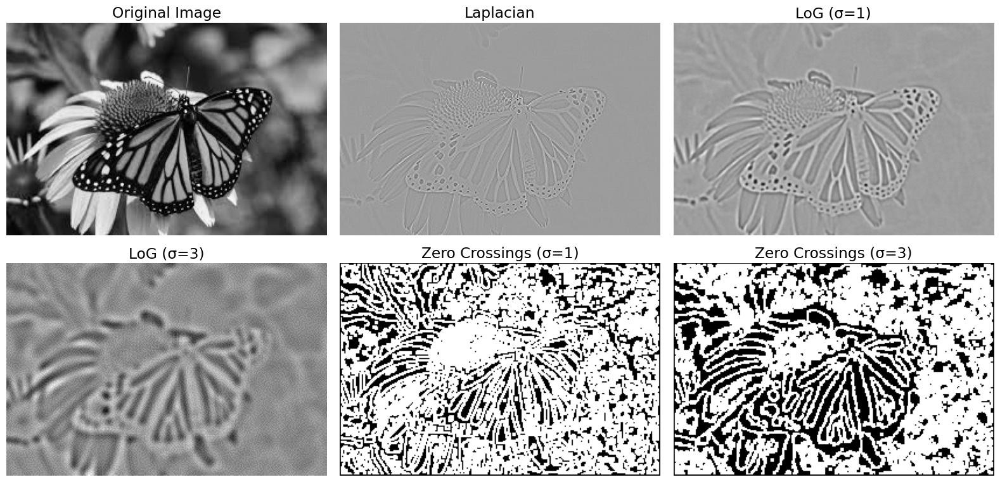

In [20]:
# Apply Laplacian operator
laplacian = cv2.Laplacian(gray_image, cv2.CV_64F)

# Laplacian of Gaussian (LoG) - often more robust
def laplacian_of_gaussian(image, sigma=1.0):
    # First smooth with Gaussian
    smoothed = cv2.GaussianBlur(image, (0, 0), sigma)
    # Then apply Laplacian
    return cv2.Laplacian(smoothed, cv2.CV_64F)

# Apply LoG with different sigma values
log_sigma1 = laplacian_of_gaussian(gray_image, 1.0)
log_sigma3 = laplacian_of_gaussian(gray_image, 3.0)

# Display the results
plt.figure(figsize=(16, 8))

# Original image
plt.subplot(2, 3, 1)
plt.imshow(gray_image, cmap='gray')
plt.title("Original Image")
plt.axis('off')

# Laplacian (no smoothing)
plt.subplot(2, 3, 2)
plt.imshow(normalize_for_display(laplacian), cmap='gray')
plt.title("Laplacian")
plt.axis('off')

# LoG with different sigmas
plt.subplot(2, 3, 3)
plt.imshow(normalize_for_display(log_sigma1), cmap='gray')
plt.title("LoG (σ=1)")
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(normalize_for_display(log_sigma3), cmap='gray')
plt.title("LoG (σ=3)")
plt.axis('off')

# Zero crossings - where the Laplacian changes sign
# These often correspond to edge locations
def zero_crossings(laplacian):
    rows, cols = laplacian.shape
    zeroc = np.zeros((rows, cols), dtype=np.uint8)
    
    # Find zero crossings
    for i in range(1, rows-1):
        for j in range(1, cols-1):
            # Check if the sign changes in any direction
            patch = laplacian[i-1:i+2, j-1:j+2]
            max_val = np.max(patch)
            min_val = np.min(patch)
            if min_val < 0 and max_val > 0:
                zeroc[i, j] = 255
    
    return zeroc

# Compute and display zero crossings
zc_log_sigma1 = zero_crossings(log_sigma1)
zc_log_sigma3 = zero_crossings(log_sigma3)

plt.subplot(2, 3, 5)
plt.imshow(zc_log_sigma1, cmap='gray')
plt.title("Zero Crossings (σ=1)")
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(zc_log_sigma3, cmap='gray')
plt.title("Zero Crossings (σ=3)")
plt.axis('off')

plt.tight_layout()
plt.show()

> **Interactive Exercise**:
> 1. Compare the edge detection results from the first derivatives (gradients) with the zero crossings of the second derivatives (Laplacian).
> 2. How does changing the sigma value affect the detected edges?
> 3. In what scenarios might you prefer gradient-based edge detection over Laplacian-based detection?
>

<a id="histograms"></a>
## 6. Image Histograms

Histograms are statistical representations of image intensity distributions. They're essential tools for understanding image characteristics and form the basis for many image enhancement techniques.

### 6.1 Understanding Image Histograms

An image histogram shows the frequency distribution of pixel intensities. For a grayscale image with values [0-255], the histogram has 256 bins, each representing the count of pixels with that intensity value.



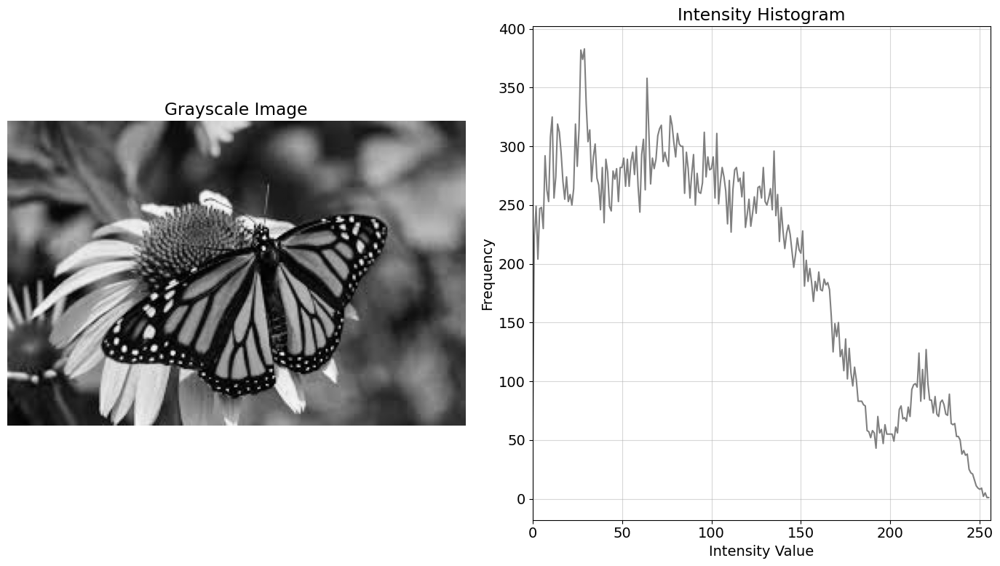

In [15]:
# Calculate and plot the histogram of the grayscale image
hist = cv2.calcHist([gray_image], [0], None, [256], [0, 256])

plt.figure(figsize=(14, 8))

# Display the original image
plt.subplot(1, 2, 1)
plt.imshow(gray_image, cmap='gray')
plt.title("Grayscale Image")
plt.axis('off')

# Display its histogram
plt.subplot(1, 2, 2)
plt.plot(hist, color='gray')
plt.title("Intensity Histogram")
plt.xlabel("Intensity Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])
plt.grid(alpha=0.5)

plt.tight_layout()
plt.show()


### 6.2 Interpreting Histograms

The shape of a histogram provides valuable information about an image:

- **Narrow histogram**: Low contrast image (few intensity values)
- **Wide histogram**: High contrast image (wide range of intensities)
- **Peaks and valleys**: Common intensity values and gaps
- **Left skew**: Dark image (more low-intensity pixels)
- **Right skew**: Bright image (more high-intensity pixels)

Let's create and compare histograms for different types of images:

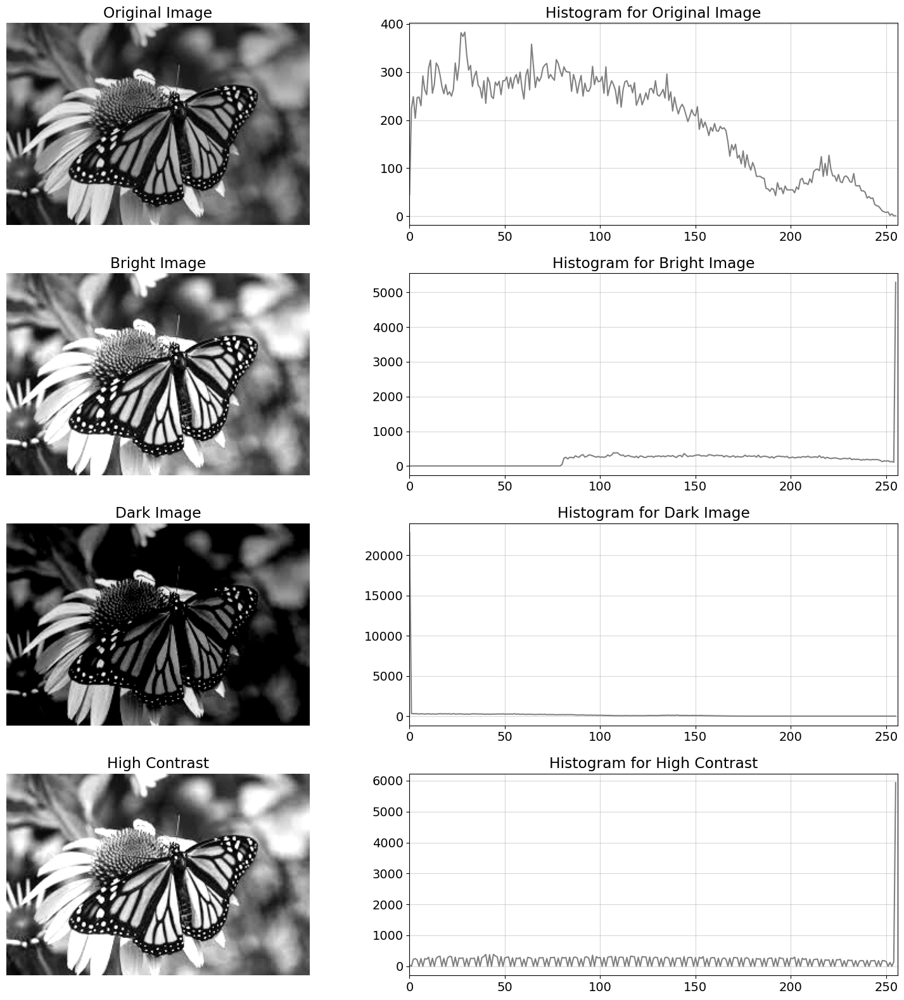

In [16]:
# Create images with different characteristics
bright_image = np.clip(gray_image.astype(np.int16) + 80, 0, 255).astype(np.uint8)
dark_image = np.clip(gray_image.astype(np.int16) - 80, 0, 255).astype(np.uint8)
low_contrast = cv2.convertScaleAbs(gray_image, alpha=0.5, beta=70)  # Reduce contrast
high_contrast = cv2.convertScaleAbs(gray_image, alpha=1.5, beta=0)  # Increase contrast

# Function to display image alongside its histogram
def plot_image_with_histogram(image, title, ax1, ax2):
    # Display image
    ax1.imshow(image, cmap='gray')
    ax1.set_title(title)
    ax1.axis('off')
    
    # Calculate and display histogram
    hist = cv2.calcHist([image], [0], None, [256], [0, 256])
    ax2.plot(hist, color='gray')
    ax2.set_title(f"Histogram for {title}")
    ax2.set_xlim([0, 256])
    ax2.grid(alpha=0.5)

# Create subplot grid
fig, axs = plt.subplots(4, 2, figsize=(16, 16))

# Plot each image with its histogram
plot_image_with_histogram(gray_image, "Original Image", axs[0, 0], axs[0, 1])
plot_image_with_histogram(bright_image, "Bright Image", axs[1, 0], axs[1, 1])
plot_image_with_histogram(dark_image, "Dark Image", axs[2, 0], axs[2, 1])
plot_image_with_histogram(high_contrast, "High Contrast", axs[3, 0], axs[3, 1])

plt.tight_layout()
plt.show()

### 6.3 Color Image Histograms

For color images, we can analyze histograms for each color channel separately:

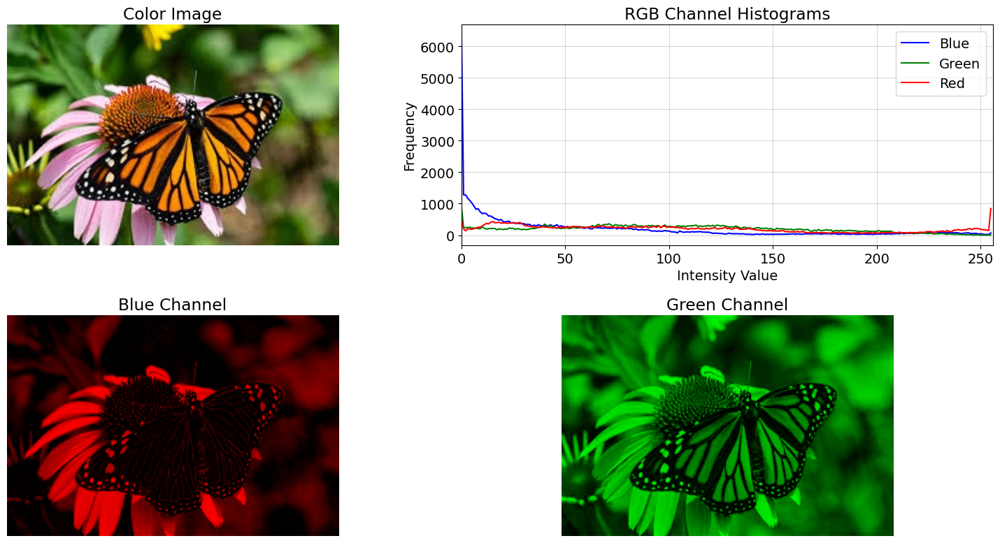

In [17]:
# Calculate histograms for each color channel
color_img = original_image  # Use the original color image

# OpenCV uses BGR order, so we need to separate channels
b, g, r = cv2.split(color_img)

# Calculate histograms
hist_b = cv2.calcHist([b], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_r = cv2.calcHist([r], [0], None, [256], [0, 256])

# Display the color image and its channel histograms
plt.figure(figsize=(16, 8))

# Original color image
plt.subplot(2, 2, 1)
plt.imshow(cv2.cvtColor(color_img, cv2.COLOR_BGR2RGB))
plt.title("Color Image")
plt.axis('off')

# Histograms for each channel
plt.subplot(2, 2, 2)
plt.plot(hist_b, color='blue', label='Blue')
plt.plot(hist_g, color='green', label='Green')
plt.plot(hist_r, color='red', label='Red')
plt.title("RGB Channel Histograms")
plt.xlabel("Intensity Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])
plt.legend()
plt.grid(alpha=0.5)

# Individual channel images
plt.subplot(2, 2, 3)
plt.imshow(cv2.merge([b, np.zeros_like(b), np.zeros_like(b)]), cmap='Blues')
plt.title("Blue Channel")
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(cv2.merge([np.zeros_like(g), g, np.zeros_like(g)]), cmap='Greens')
plt.title("Green Channel")
plt.axis('off')

plt.tight_layout()
plt.show()

### 6.4 Cumulative Histograms

A cumulative histogram shows the cumulative number of pixels at each intensity level or below. It's particularly useful for histogram equalization:

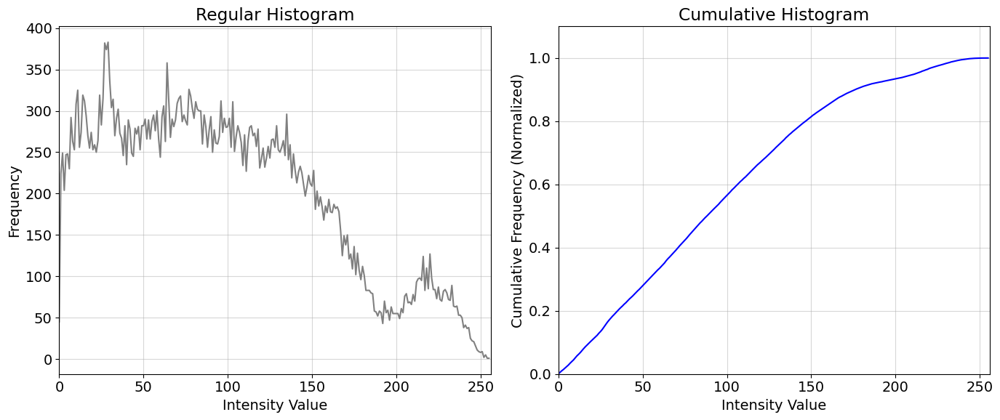

In [22]:
# Calculate the histogram and cumulative histogram
hist = cv2.calcHist([gray_image], [0], None, [256], [0, 256])
cum_hist = np.cumsum(hist)  # Calculate cumulative sum
cum_hist_normalized = cum_hist / cum_hist[-1]  # Normalize to 0-1 range

plt.figure(figsize=(14, 6))

# Plot regular histogram
plt.subplot(1, 2, 1)
plt.plot(hist, color='gray')
plt.title("Regular Histogram")
plt.xlabel("Intensity Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])
plt.grid(alpha=0.5)

# Plot cumulative histogram
plt.subplot(1, 2, 2)
plt.plot(cum_hist_normalized, color='blue')
plt.title("Cumulative Histogram")
plt.xlabel("Intensity Value")
plt.ylabel("Cumulative Frequency (Normalized)")
plt.xlim([0, 256])
plt.ylim([0, 1.1])
plt.grid(alpha=0.5)

plt.tight_layout()
plt.show()


> **Mathematical Insight**: The cumulative histogram represents the cumulative distribution function (CDF) of the image's intensity values. This CDF is the basis for histogram equalization, which we'll explore next.

<a id="equalization"></a>


<a id="equalization"></a>
## 7. Histogram Equalization

Histogram equalization is a powerful technique that enhances image contrast by effectively spreading out the most frequent intensity values.

### 7.1 Mathematical Foundation of Histogram Equalization

The goal of histogram equalization is to transform the intensity values in an image such that the resulting histogram is approximately uniform. The transformation function is derived from the cumulative histogram:

$$h(v) = \text{round} \left( (L-1) \cdot \text{CDF}(v) \right)$$

Where:
- $h(v)$ is the new value for intensity $v$
- $L$ is the number of possible intensity values (usually 256)
- $\text{CDF}(v)$ is the cumulative distribution function (normalized to [0,1])


### 7.2 Implementing Histogram Equalization

Let's implement and visualize the effects of histogram equalization:



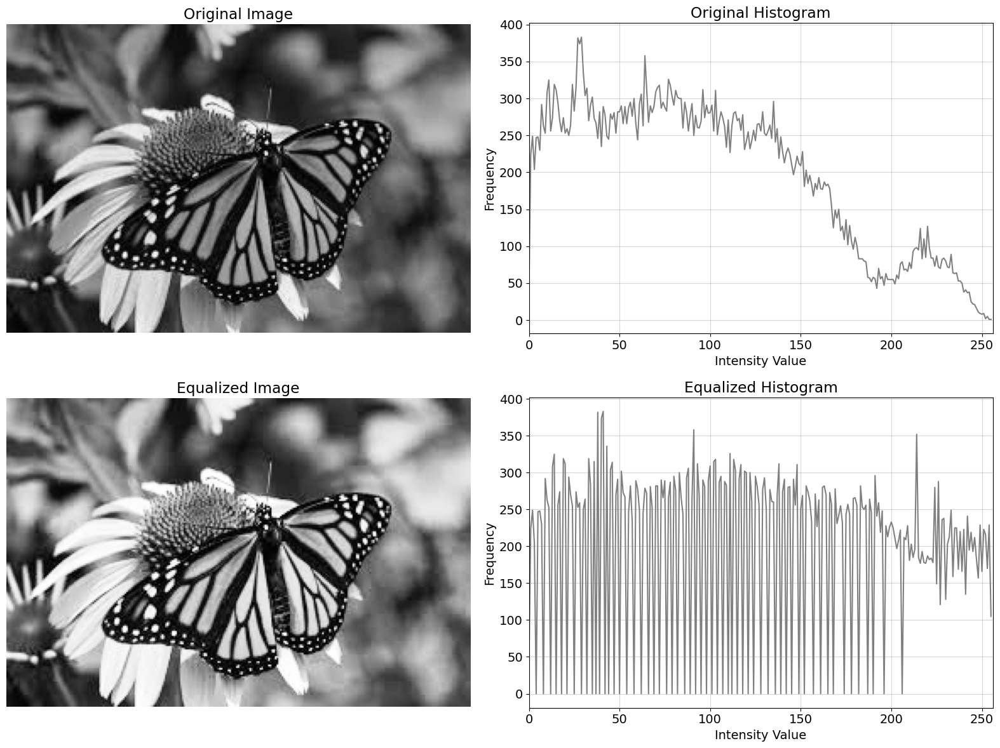

In [19]:
# Apply histogram equalization
equalized_image = cv2.equalizeHist(gray_image)

# Calculate histograms before and after equalization
hist_original = cv2.calcHist([gray_image], [0], None, [256], [0, 256])
hist_equalized = cv2.calcHist([equalized_image], [0], None, [256], [0, 256])

# Display results
plt.figure(figsize=(16, 12))

# Original image and its histogram
plt.subplot(2, 2, 1)
plt.imshow(gray_image, cmap='gray')
plt.title("Original Image")
plt.axis('off')

plt.subplot(2, 2, 2)
plt.plot(hist_original, color='gray')
plt.title("Original Histogram")
plt.xlabel("Intensity Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])
plt.grid(alpha=0.5)

# Equalized image and its histogram
plt.subplot(2, 2, 3)
plt.imshow(equalized_image, cmap='gray')
plt.title("Equalized Image")
plt.axis('off')

plt.subplot(2, 2, 4)
plt.plot(hist_equalized, color='gray')
plt.title("Equalized Histogram")
plt.xlabel("Intensity Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])
plt.grid(alpha=0.5)

plt.tight_layout()
plt.show()

### 7.3 Understanding the Transformation Function

To better understand how histogram equalization works, let's visualize the transformation function that maps original intensities to new ones:

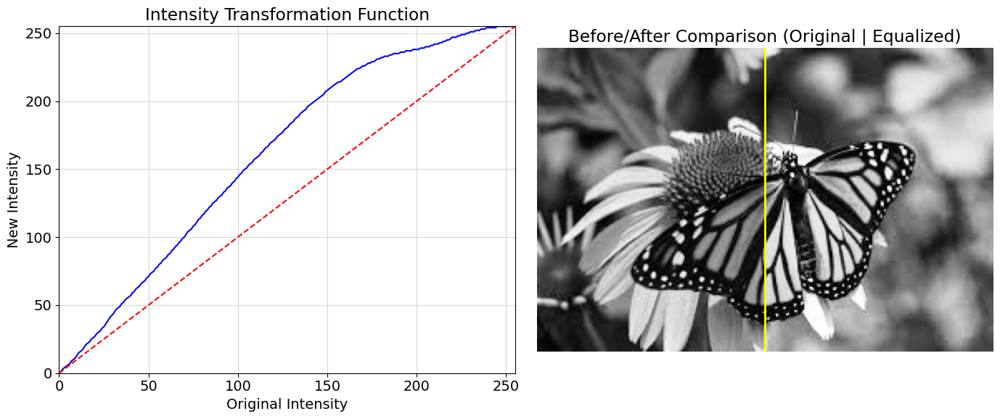

In [20]:
# Calculate the cumulative histogram and the transformation function
hist_cumulative = np.cumsum(hist_original)
hist_cumulative_normalized = hist_cumulative / hist_cumulative[-1]
transformation_function = np.round((256-1) * hist_cumulative_normalized)

# Plot the transformation function
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.plot(range(256), transformation_function, color='blue')
plt.plot([0, 255], [0, 255], 'r--')  # Diagonal line for reference
plt.title("Intensity Transformation Function")
plt.xlabel("Original Intensity")
plt.ylabel("New Intensity")
plt.xlim([0, 255])
plt.ylim([0, 255])
plt.grid(alpha=0.5)

# Display the side-by-side comparison with a split effect
plt.subplot(1, 2, 2)
split_image = np.zeros_like(gray_image)
h, w = gray_image.shape
split_point = w // 2
split_image[:, 0:split_point] = gray_image[:, 0:split_point]
split_image[:, split_point:] = equalized_image[:, split_point:]

plt.imshow(split_image, cmap='gray')
plt.axvline(split_point, color='yellow', linestyle='-', linewidth=2)
plt.title("Before/After Comparison (Original | Equalized)")
plt.axis('off')

plt.tight_layout()
plt.show()

### 7.4 Histogram Equalization for Color Images

Histogram equalization on color images requires special care. Directly equalizing each RGB channel would alter the color balance. One approach is to convert to a color space that separates intensity from color (like HSV or YCrCb), equalize only the intensity channel, and then convert back:

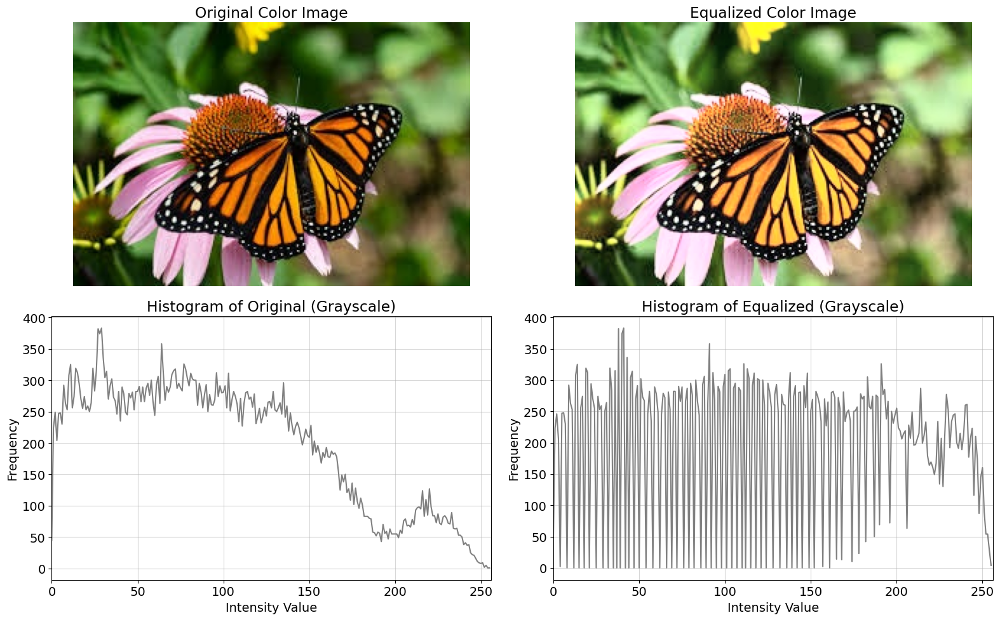

In [21]:
def equalize_color_image(image):
    """Equalizes a color image by converting to YCrCb, equalizing Y, and converting back"""
    # Convert to YCrCb color space
    ycrcb = cv2.cvtColor(image, cv2.COLOR_BGR2YCrCb)
    
    # Split channels
    y, cr, cb = cv2.split(ycrcb)
    
    # Equalize the Y (luminance) channel
    y_eq = cv2.equalizeHist(y)
    
    # Merge channels and convert back to BGR
    ycrcb_eq = cv2.merge([y_eq, cr, cb])
    result = cv2.cvtColor(ycrcb_eq, cv2.COLOR_YCrCb2BGR)
    
    return result

# Apply equalization on the color image
color_image = original_image.copy()
equalized_color_image = equalize_color_image(color_image)

# Display the results
plt.figure(figsize=(16, 10))

# Original color image
plt.subplot(2, 2, 1)
plt.imshow(cv2.cvtColor(color_image, cv2.COLOR_BGR2RGB))
plt.title("Original Color Image")
plt.axis('off')

# Equalized color image
plt.subplot(2, 2, 2)
plt.imshow(cv2.cvtColor(equalized_color_image, cv2.COLOR_BGR2RGB))
plt.title("Equalized Color Image")
plt.axis('off')

# Display histograms of the grayscale versions for comparison
gray_original = cv2.cvtColor(color_image, cv2.COLOR_BGR2GRAY)
gray_equalized = cv2.cvtColor(equalized_color_image, cv2.COLOR_BGR2GRAY)

hist_gray_original = cv2.calcHist([gray_original], [0], None, [256], [0, 256])
hist_gray_equalized = cv2.calcHist([gray_equalized], [0], None, [256], [0, 256])

plt.subplot(2, 2, 3)
plt.plot(hist_gray_original, color='gray')
plt.title("Histogram of Original (Grayscale)")
plt.xlabel("Intensity Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])
plt.grid(alpha=0.5)

plt.subplot(2, 2, 4)
plt.plot(hist_gray_equalized, color='gray')
plt.title("Histogram of Equalized (Grayscale)")
plt.xlabel("Intensity Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])
plt.grid(alpha=0.5)

plt.tight_layout()
plt.show()

### 7.5 Limitations of Global Histogram Equalization

While histogram equalization effectively enhances contrast, it has some limitations:

1. It applies a global transformation, which might not be ideal for images with varying lighting conditions across different regions
2. It can amplify noise in relatively homogeneous areas
3. It might lead to unnatural-looking results or loss of detail in certain scenarios

Let's see these limitations in action:

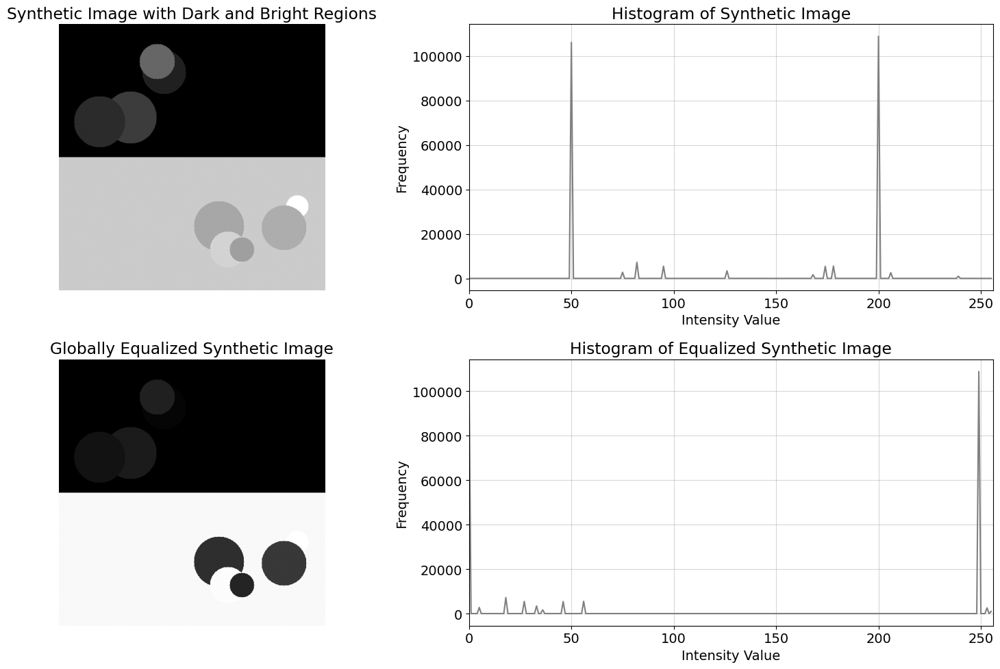

In [24]:
# Create a synthetic image with varying brightness regions
synthetic_image = np.zeros((500, 500), dtype=np.uint8)
synthetic_image[0:250, 0:500] = 50  # Dark region
synthetic_image[250:500, 0:500] = 200  # Bright region

# Add some details to both regions
for i in range(5):
    pos_x = np.random.randint(50, 200)
    pos_y = np.random.randint(50, 200)
    radius = np.random.randint(20, 50)
    color = np.random.randint(70, 130)
    cv2.circle(synthetic_image, (pos_x, pos_y), radius, color, -1)
    
    pos_x = np.random.randint(300, 450)
    pos_y = np.random.randint(300, 450)
    radius = np.random.randint(20, 50)
    color = np.random.randint(150, 240)
    cv2.circle(synthetic_image, (pos_x, pos_y), radius, color, -1)

# Apply global histogram equalization
equalized_synthetic = cv2.equalizeHist(synthetic_image)

# Display the results
plt.figure(figsize=(16, 10))

# Synthetic image and its histogram
plt.subplot(2, 2, 1)
plt.imshow(synthetic_image, cmap='gray')
plt.title("Synthetic Image with Dark and Bright Regions")
plt.axis('off')

plt.subplot(2, 2, 2)
hist_synthetic = cv2.calcHist([synthetic_image], [0], None, [256], [0, 256])
plt.plot(hist_synthetic, color='gray')
plt.title("Histogram of Synthetic Image")
plt.xlabel("Intensity Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])
plt.grid(alpha=0.5)

# Equalized synthetic image and its histogram
plt.subplot(2, 2, 3)
plt.imshow(equalized_synthetic, cmap='gray')
plt.title("Globally Equalized Synthetic Image")
plt.axis('off')

plt.subplot(2, 2, 4)
hist_eq_synthetic = cv2.calcHist([equalized_synthetic], [0], None, [256], [0, 256])
plt.plot(hist_eq_synthetic, color='gray')
plt.title("Histogram of Equalized Synthetic Image")
plt.xlabel("Intensity Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])
plt.grid(alpha=0.5)

plt.tight_layout()
plt.show()

> **Common Pitfall**: Notice that while global histogram equalization improves contrast overall, it may not be optimal for all parts of the image. Some details in the bright region may become too bright, while details in the dark region might become too dark. This is where adaptive histogram equalization comes in.

<a id="adaptive"></a>
## 8. Adaptive Histogram Equalization

Adaptive Histogram Equalization (AHE) and its variant, Contrast Limited Adaptive Histogram Equalization (CLAHE), address the limitations of global histogram equalization by processing the image in small regions.

### 8.1 Basic Principles of AHE

The key idea behind AHE is to divide the image into small tiles, apply histogram equalization to each tile independently, and then blend the results at tile boundaries to remove artifacts:

1. Split the image into small rectangular regions (tiles)
2. Apply histogram equalization to each tile separately
3. Use bilinear interpolation to combine the results at the boundaries

This approach allows the enhancement to adapt to the local content of the image, improving local contrast while maintaining the overall appearance.

### 8.2 Contrast Limited AHE (CLAHE)

CLAHE improves upon basic AHE by limiting contrast amplification, which helps reduce noise amplification. The key steps are:

1. Divide the image into tiles
2. Compute the histogram for each tile
3. **Clip** the histogram at a predefined value to limit contrast enhancement
4. Redistribute the clipped pixels equally across all histogram bins
5. Calculate the CDF for each clipped and redistributed histogram
6. Apply the mapping functions with bilinear interpolation

Let's implement and visualize CLAHE:

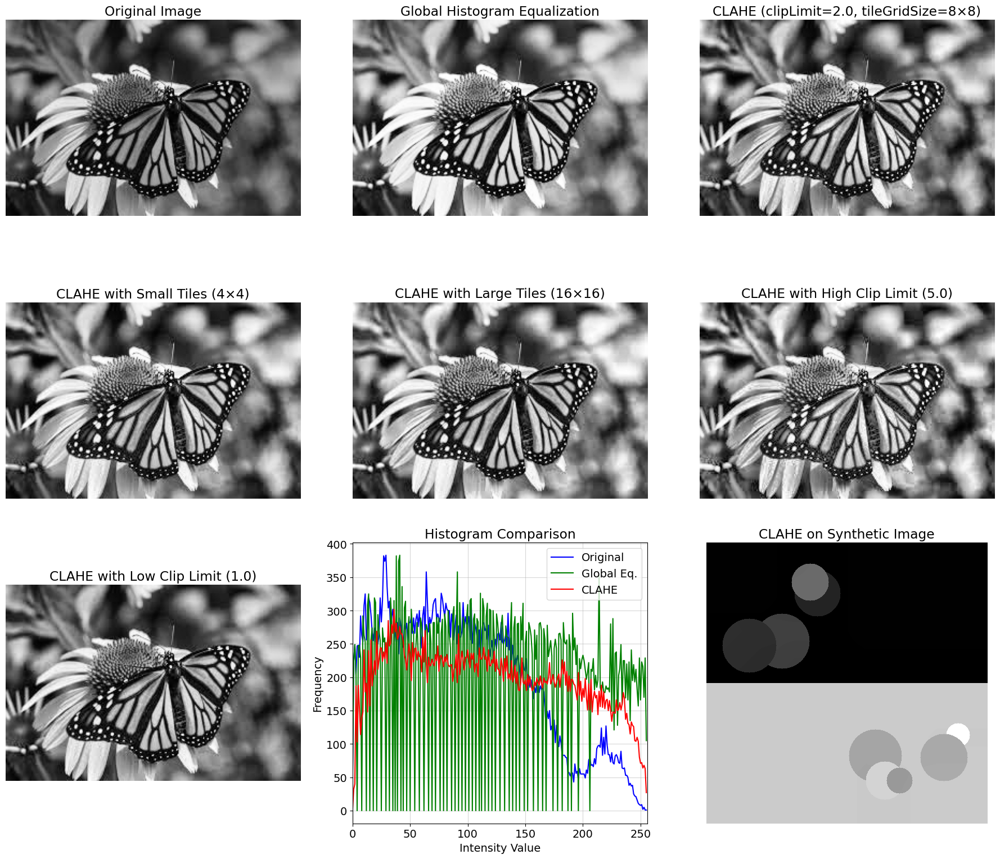

In [25]:
# Apply CLAHE with different parameters
clahe_default = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
clahe_small_tiles = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(4, 4))
clahe_large_tiles = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(16, 16))
clahe_high_clip = cv2.createCLAHE(clipLimit=5.0, tileGridSize=(8, 8))
clahe_low_clip = cv2.createCLAHE(clipLimit=1.0, tileGridSize=(8, 8))

# Apply the different CLAHE configurations
clahe_default_img = clahe_default.apply(gray_image)
clahe_small_tiles_img = clahe_small_tiles.apply(gray_image)
clahe_large_tiles_img = clahe_large_tiles.apply(gray_image)
clahe_high_clip_img = clahe_high_clip.apply(gray_image)
clahe_low_clip_img = clahe_low_clip.apply(gray_image)

# Compute global histogram equalization for comparison
global_eq_img = cv2.equalizeHist(gray_image)

# Display the results
plt.figure(figsize=(18, 16))

# Original image
plt.subplot(3, 3, 1)
plt.imshow(gray_image, cmap='gray')
plt.title("Original Image")
plt.axis('off')

# Global histogram equalization
plt.subplot(3, 3, 2)
plt.imshow(global_eq_img, cmap='gray')
plt.title("Global Histogram Equalization")
plt.axis('off')

# CLAHE with default parameters
plt.subplot(3, 3, 3)
plt.imshow(clahe_default_img, cmap='gray')
plt.title("CLAHE (clipLimit=2.0, tileGridSize=8×8)")
plt.axis('off')

# CLAHE with small tiles
plt.subplot(3, 3, 4)
plt.imshow(clahe_small_tiles_img, cmap='gray')
plt.title("CLAHE with Small Tiles (4×4)")
plt.axis('off')

# CLAHE with large tiles
plt.subplot(3, 3, 5)
plt.imshow(clahe_large_tiles_img, cmap='gray')
plt.title("CLAHE with Large Tiles (16×16)")
plt.axis('off')

# CLAHE with high clip limit
plt.subplot(3, 3, 6)
plt.imshow(clahe_high_clip_img, cmap='gray')
plt.title("CLAHE with High Clip Limit (5.0)")
plt.axis('off')

# CLAHE with low clip limit
plt.subplot(3, 3, 7)
plt.imshow(clahe_low_clip_img, cmap='gray')
plt.title("CLAHE with Low Clip Limit (1.0)")
plt.axis('off')

# Display histograms for original, global equalization, and default CLAHE
plt.subplot(3, 3, 8)
hist_original = cv2.calcHist([gray_image], [0], None, [256], [0, 256])
hist_global_eq = cv2.calcHist([global_eq_img], [0], None, [256], [0, 256])
hist_clahe = cv2.calcHist([clahe_default_img], [0], None, [256], [0, 256])

plt.plot(hist_original, color='blue', label='Original')
plt.plot(hist_global_eq, color='green', label='Global Eq.')
plt.plot(hist_clahe, color='red', label='CLAHE')
plt.title("Histogram Comparison")
plt.xlabel("Intensity Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])
plt.legend()
plt.grid(alpha=0.5)

# Apply CLAHE to our synthetic image with distinct regions
clahe_synthetic = clahe_default.apply(synthetic_image)

plt.subplot(3, 3, 9)
plt.imshow(clahe_synthetic, cmap='gray')
plt.title("CLAHE on Synthetic Image")
plt.axis('off')

plt.tight_layout()
plt.show()


### 8.3 CLAHE for Color Images

Similar to global histogram equalization, CLAHE can be applied to color images by working in a color space that separates intensity from color information:

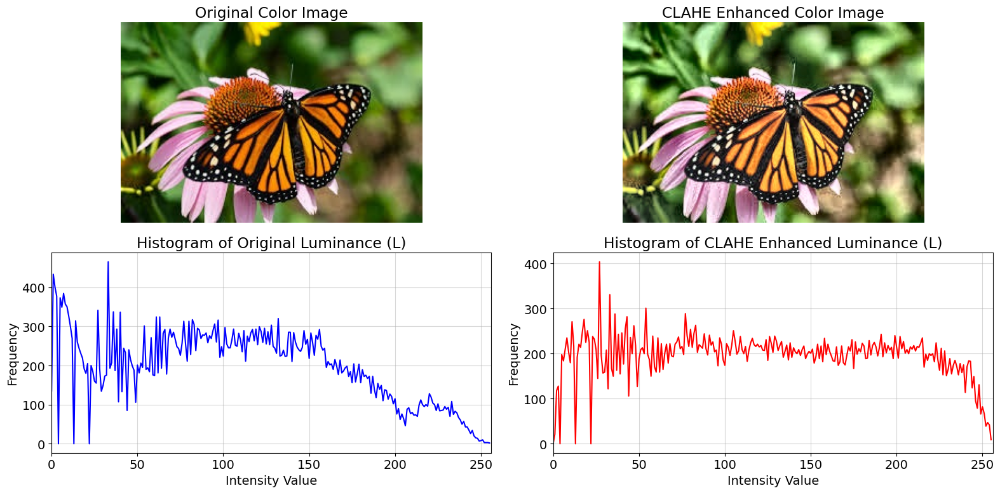

In [28]:
def apply_clahe_to_color(image, clip_limit=2.0, tile_grid_size=(8, 8)):
    """Apply CLAHE to a color image by working in the Lab color space"""
    # Convert to Lab color space
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    
    # Split channels
    l, a, b = cv2.split(lab)
    
    # Apply CLAHE to the L channel
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    l_clahe = clahe.apply(l)
    
    # Merge channels and convert back to BGR
    lab_clahe = cv2.merge([l_clahe, a, b])
    result = cv2.cvtColor(lab_clahe, cv2.COLOR_LAB2BGR)
    
    return result

# Apply CLAHE to our color image
color_clahe = apply_clahe_to_color(original_image, clip_limit=3.0, tile_grid_size=(8, 8))

# Display results
plt.figure(figsize=(16, 8))

# Original color image
plt.subplot(2, 2, 1)
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.title("Original Color Image")
plt.axis('off')

# CLAHE enhanced color image
plt.subplot(2, 2, 2)
plt.imshow(cv2.cvtColor(color_clahe, cv2.COLOR_BGR2RGB))
plt.title("CLAHE Enhanced Color Image")
plt.axis('off')

# Compare histograms of luminance channels
# Convert to Lab for analysis
lab_original = cv2.cvtColor(original_image, cv2.COLOR_BGR2LAB)
lab_clahe = cv2.cvtColor(color_clahe, cv2.COLOR_BGR2LAB)

# Extract L channels
l_original = lab_original[:,:,0]
l_clahe = lab_clahe[:,:,0]

# Calculate histograms
hist_l_original = cv2.calcHist([l_original], [0], None, [256], [0, 256])
hist_l_clahe = cv2.calcHist([l_clahe], [0], None, [256], [0, 256])

# Plot histograms
plt.subplot(2, 2, 3)
plt.plot(hist_l_original, color='blue')
plt.title("Histogram of Original Luminance (L)")
plt.xlabel("Intensity Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])
plt.grid(alpha=0.5)

plt.subplot(2, 2, 4)
plt.plot(hist_l_clahe, color='red')
plt.title("Histogram of CLAHE Enhanced Luminance (L)")
plt.xlabel("Intensity Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])
plt.grid(alpha=0.5)

plt.tight_layout()
plt.show()

### 8.4 Practical Applications of Adaptive Histogram Equalization

CLAHE is particularly useful in:

1. **Medical Imaging**: For enhancing details in X-rays, CT scans, and MRI images
2. **Underwater Photography**: To correct for poor visibility and color distortion
3. **Satellite Imagery**: To improve visibility of terrain features
4. **Face Recognition**: As a preprocessing step to normalize lighting conditions

Let's demonstrate these strengths with a challenging example:

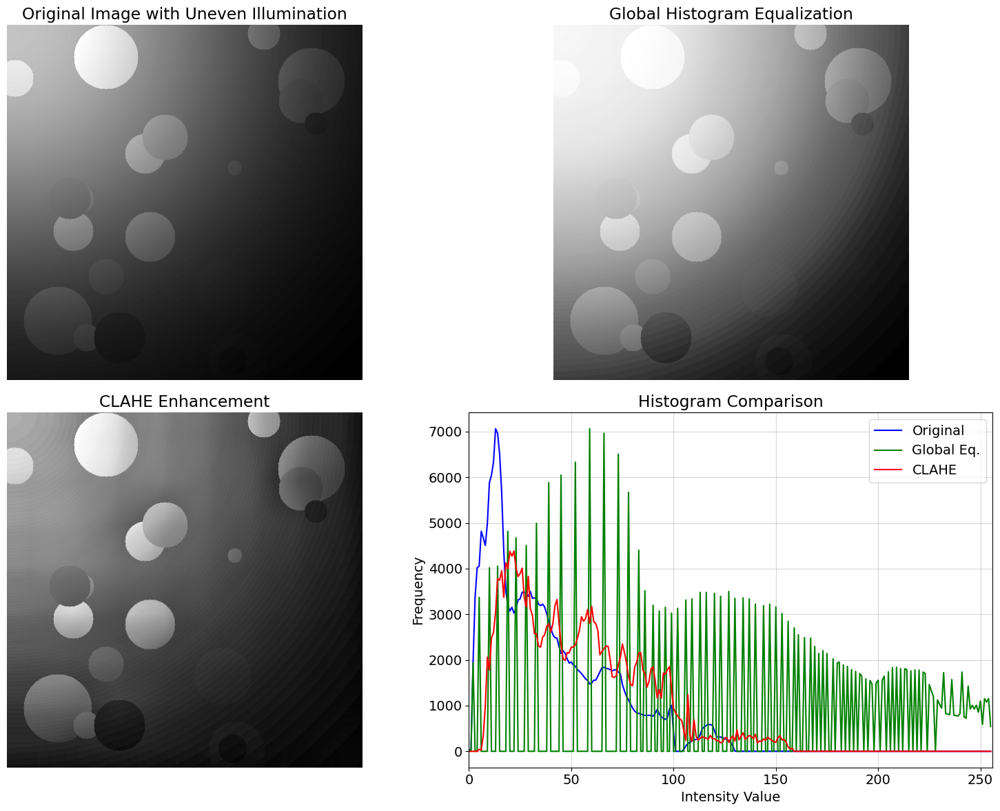

In [25]:
# Create a synthetic image with uneven illumination
def create_uneven_illumination_image():
    # Create base image with some content
    base_img = np.ones((500, 500), dtype=np.uint8) * 128
    
    # Add some objects
    for i in range(20):
        x = np.random.randint(0, 500)
        y = np.random.randint(0, 500)
        r = np.random.randint(10, 50)
        val = np.random.randint(100, 200)
        cv2.circle(base_img, (x, y), r, val, -1)
    
    # Create illumination gradient (bright in top-left, dark in bottom-right)
    y, x = np.mgrid[0:500, 0:500]
    illumination = np.exp(-((x - 0)**2 + (y - 0)**2) / (2 * 250**2)) * 200
    
    # Apply illumination to image
    illuminated_img = base_img.astype(np.float32) * (illumination / 255.0)
    illuminated_img = np.clip(illuminated_img, 0, 255).astype(np.uint8)
    
    return illuminated_img

# Create our test image
uneven_image = create_uneven_illumination_image()

# Apply different enhancement methods
global_eq_uneven = cv2.equalizeHist(uneven_image)
clahe_uneven = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8)).apply(uneven_image)

# Display results
plt.figure(figsize=(16, 12))

# Original image with uneven illumination
plt.subplot(2, 2, 1)
plt.imshow(uneven_image, cmap='gray')
plt.title("Original Image with Uneven Illumination")
plt.axis('off')

# Global equalization result
plt.subplot(2, 2, 2)
plt.imshow(global_eq_uneven, cmap='gray')
plt.title("Global Histogram Equalization")
plt.axis('off')

# CLAHE result
plt.subplot(2, 2, 3)
plt.imshow(clahe_uneven, cmap='gray')
plt.title("CLAHE Enhancement")
plt.axis('off')

# Comparison of histograms
plt.subplot(2, 2, 4)
hist_uneven = cv2.calcHist([uneven_image], [0], None, [256], [0, 256])
hist_global_eq_uneven = cv2.calcHist([global_eq_uneven], [0], None, [256], [0, 256])
hist_clahe_uneven = cv2.calcHist([clahe_uneven], [0], None, [256], [0, 256])

plt.plot(hist_uneven, color='blue', label='Original')
plt.plot(hist_global_eq_uneven, color='green', label='Global Eq.')
plt.plot(hist_clahe_uneven, color='red', label='CLAHE')
plt.title("Histogram Comparison")
plt.xlabel("Intensity Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])
plt.legend()
plt.grid(alpha=0.5)

plt.tight_layout()
plt.show()

> **Common Pitfall**: While CLAHE generally performs better than global histogram equalization for many applications, it can sometimes create artificial boundaries between tiles or unnatural-looking local enhancements. The key parameters to tune are:
>
> 1. **Clip Limit**: Controls how much contrast enhancement is allowed (higher values allow more contrast)
> 2. **Tile Grid Size**: Controls the size of local regions (smaller tiles adapt more to local content but might create more artifacts)

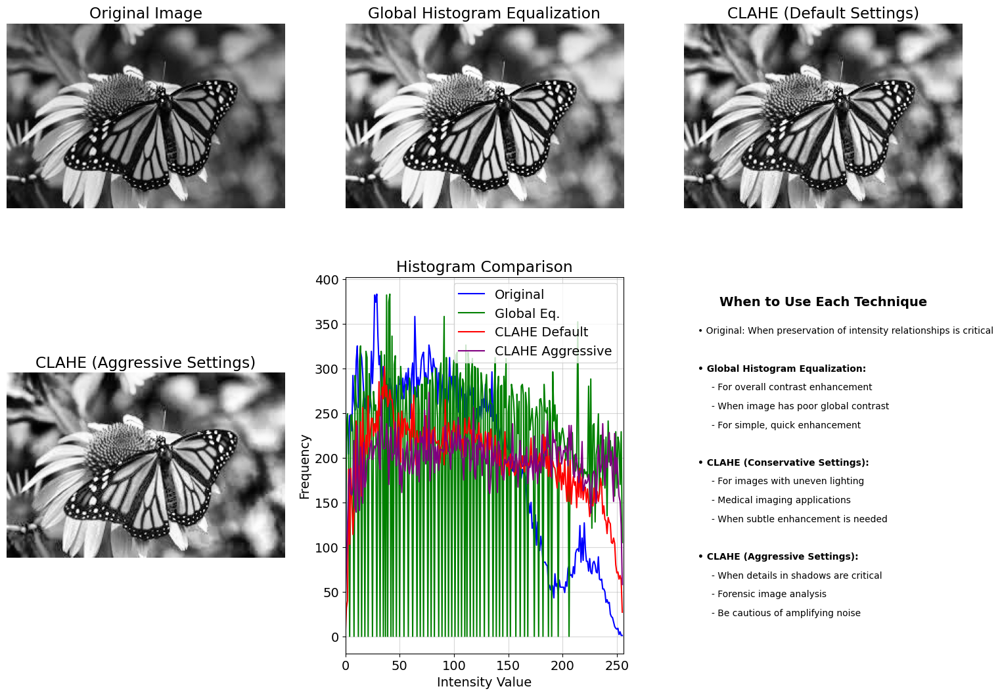

In [29]:
# Create a summary visualization showing all the techniques we've learned
plt.figure(figsize=(16, 12))

# Display original image
plt.subplot(2, 3, 1)
plt.imshow(gray_image, cmap='gray')
plt.title("Original Image")
plt.axis('off')

# Global histogram equalization
plt.subplot(2, 3, 2)
plt.imshow(global_eq_img, cmap='gray')
plt.title("Global Histogram Equalization")
plt.axis('off')

# CLAHE with moderate settings
plt.subplot(2, 3, 3)
plt.imshow(clahe_default_img, cmap='gray')
plt.title("CLAHE (Default Settings)")
plt.axis('off')

# CLAHE with aggressive settings
clahe_aggressive = cv2.createCLAHE(clipLimit=4.0, tileGridSize=(4, 4)).apply(gray_image)
plt.subplot(2, 3, 4)
plt.imshow(clahe_aggressive, cmap='gray')
plt.title("CLAHE (Aggressive Settings)")
plt.axis('off')

# Compare histograms
plt.subplot(2, 3, 5)
hist_original = cv2.calcHist([gray_image], [0], None, [256], [0, 256])
hist_global_eq = cv2.calcHist([global_eq_img], [0], None, [256], [0, 256])
hist_clahe_default = cv2.calcHist([clahe_default_img], [0], None, [256], [0, 256])
hist_clahe_aggressive = cv2.calcHist([clahe_aggressive], [0], None, [256], [0, 256])

plt.plot(hist_original, color='blue', label='Original')
plt.plot(hist_global_eq, color='green', label='Global Eq.')
plt.plot(hist_clahe_default, color='red', label='CLAHE Default')
plt.plot(hist_clahe_aggressive, color='purple', label='CLAHE Aggressive')
plt.title("Histogram Comparison")
plt.xlabel("Intensity Value")
plt.ylabel("Frequency")
plt.xlim([0, 256])
plt.legend()
plt.grid(alpha=0.5)

# Best practices and selection guide
plt.subplot(2, 3, 6)
plt.axis('off')
plt.text(0.5, 0.95, "When to Use Each Technique", ha='center', va='top', fontsize=14, weight='bold')
plt.text(0.05, 0.85, "• Original: When preservation of intensity relationships is critical", fontsize=10)
plt.text(0.05, 0.75, "• Global Histogram Equalization:", fontsize=10, weight='bold')
plt.text(0.1, 0.70, "- For overall contrast enhancement", fontsize=10)
plt.text(0.1, 0.65, "- When image has poor global contrast", fontsize=10)
plt.text(0.1, 0.60, "- For simple, quick enhancement", fontsize=10)
plt.text(0.05, 0.50, "• CLAHE (Conservative Settings):", fontsize=10, weight='bold')
plt.text(0.1, 0.45, "- For images with uneven lighting", fontsize=10)
plt.text(0.1, 0.40, "- Medical imaging applications", fontsize=10)
plt.text(0.1, 0.35, "- When subtle enhancement is needed", fontsize=10)
plt.text(0.05, 0.25, "• CLAHE (Aggressive Settings):", fontsize=10, weight='bold')
plt.text(0.1, 0.20, "- When details in shadows are critical", fontsize=10)
plt.text(0.1, 0.15, "- Forensic image analysis", fontsize=10)
plt.text(0.1, 0.10, "- Be cautious of amplifying noise", fontsize=10)

plt.tight_layout()
plt.show()

> **Interactive Exercise**:
> Looking at all the techniques we've covered for histogram manipulation:
>
> 1. Which technique would you choose for enhancing medical X-ray images? Why?
> 2. Which technique would be most appropriate for preparing images for computer vision algorithms like object detection?
> 3. For a photograph with a bright sky and dark foreground, which approach might yield the most natural-looking enhancement?
>
> *Write your answers in the cell below.*
